In [1]:
import pandas as pd
import rasterio as rio
import rasterio.plot as plot
import os
from shapely import geometry
import matplotlib.pyplot as plt
import numpy as np
import ipywidgets as widget

import ipysheet as ips

In [2]:
#For the interactive table to work, you've got to follow the steps to install ipysheet: 
#https://github.com/porefluid/jpl_msp_2020/blob/master/code/ECOSTRESS_image_explorer.ipynb

In [3]:
rainier_bounds = geometry.Polygon([[-121.78742980957031, 46.83193588256836], [-121.78742980957031, 46.867401123046875], [-121.73469543457031, 46.867401123046875], [-121.73469543457031, 46.83193588256836], [-121.78742980957031, 46.83193588256836]])     


In [4]:
imdir = '/Users/corey/Documents/GitHub/jpl_msp_2020/data/ecostress_mt_rainier'
plot_dir = imdir+'/plots'

plots = []
fname = []

sheet = ips.sheet()

x, y = rainier_bounds.exterior.xy


for d, s, f, in os.walk(imdir):
    for row, i in enumerate(f):
        if 'ECO2LSTE.001_SDS_Emis5_doy' in i:
            
            p = os.path.join(imdir, i)
            im = rio.open(p)
            im_read = im.read(1)
            im_read = im_read.astype(float)
            im_read[im_read == 0] = np.nan
            
            strs = i.split('_')
            scaled = (im_read*0.002)+0.49
            
            
            if np.median(scaled) >= 0.9:
                #print(p)
                out = widget.Output()
                with out:
                    fig, ax = plt.subplots()
                    plot.show(scaled, transform=im.transform, cmap='Greys', vmin=0.9, vmax=0.99, ax=ax)
                    #ax.set_xlim(x[0], x[2])
                    #ax.set_ylim(y[0], y[2])
                    plt.title(i)
                    plt.show(fig)
                    plots.append(out)
                    fname.append(p)




In [5]:
sheet = ips.sheet(columns=2, rows =len(plots))    
column1 = ips.column(0, plots)
column2 = ips.column(1, [False]*len(plots))
sheet

Sheet(cells=(Cell(column_end=0, column_start=0, row_end=123, row_start=0, squeeze_row=False, type='widget', va…

In [921]:
qc_images = pd.DataFrame({'images': fname, 'qc_flag': column2.value})

In [922]:
qced = qc_images[qc_images['qc_flag'] ==True]

qc_images.to_csv(os.path.join(imdir, 'labelled_images_rainier.csv'))

In [923]:
qc_images = pd.read_csv(os.path.join(imdir, 'labelled_images_rainier.csv'))

In [443]:
# Import GLIMS data over Mt Rainier

import geopandas as gpd

path_to_glaciers = '/Users/corey/Documents/GitHub/jpl_msp_2020/data/mt_rainier_glims/mt_rainier_glims.shp'

glaciers = gpd.read_file(path_to_glaciers)

In [636]:
qced['images'].iloc[0]

'/Users/corey/Documents/GitHub/jpl_msp_2020/data/ecostress_mt_rainier/ECO2LSTE.001_SDS_Emis5_doy2019164195707_aid0001.tif'

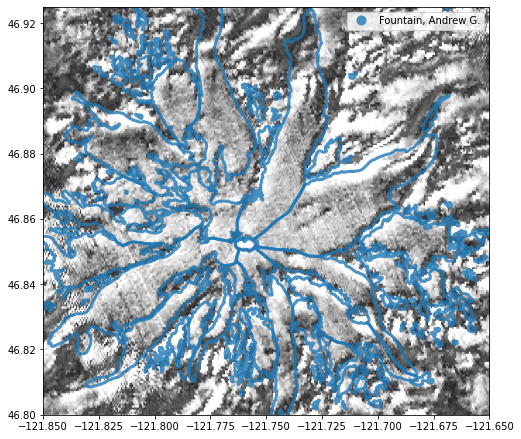

In [634]:
im = rio.open(qced['images'].iloc[0])

fig, ax = plt.subplots(figsize=(8, 8))

#glaciers.plot(ax=ax, alpha=0.8, legend=True, column='analysts', categorical=True)



plot.show(im.read(1), transform=im.transform, ax=ax, cmap='Greys', vmin=200, vmax=255)
glaciers.plot(ax=ax, alpha=0.8, legend=True, facecolor='None', edgecolor='blue', linewidth=3, column='analysts', categorical=True)
ax.set_xlim(-121.85, -121.65)
ax.set_ylim(46.8,46.925)

plt.savefig('/Users/corey/Documents/GitHub/jpl_msp_2020/figures/rainier_larger_glacier.png', dpi=300)


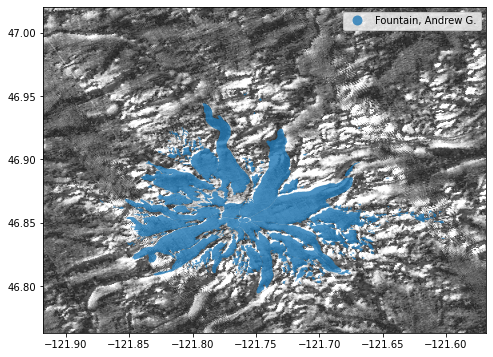

In [621]:
im = rio.open(qced['images'].iloc[0])

fig, ax = plt.subplots(figsize=(10, 6))

glaciers.plot(ax=ax, alpha=0.8, legend=True, column='analysts', categorical=True)



plot.show(im.read(1), transform=im.transform, ax=ax, cmap='Greys', vmin=200, vmax=255)
plt.savefig('/Users/corey/Documents/GitHub/jpl_msp_2020/figures/rainier_glims_setting.png', dpi=300)


In [524]:
from rasterstats import zonal_stats

means = pd.DataFrame()

for i in qced.iterrows():
    path_to_img = i[1]['images']
    dt = path_to_img.split('/')[8].split('_')[3]
    z = zonal_stats(path_to_glaciers, path_to_img,
            stats="mean")
    stats = pd.DataFrame(z)
#    stats.columns = [doy]
    t = int(dt[3:])
    dt = pd.to_datetime(t, format='%Y%j%H%M%S')
    means[dt] = stats['mean']
    
means = means.sort_index(axis=0)

means.columns.rename('datetime', inplace=True)
means.columns = means.columns - pd.Timedelta(7, 'h')

hour = means.columns.hour
minute = means.columns.minute
second = means.columns.second

ts_int = (hour-7)*60*60 + minute*60 + second

time = pd.DataFrame({'hour': ts_int}, index=means.columns).transpose()

Timestamp('2020-04-13 18:55:11')

ValueError: 0 rows not supported

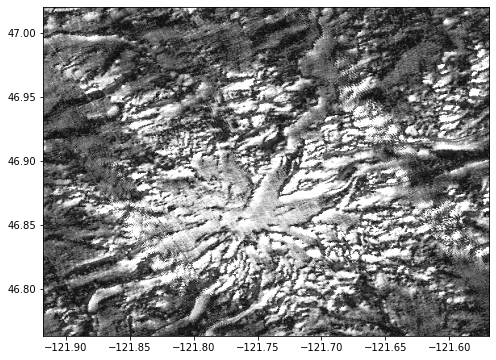

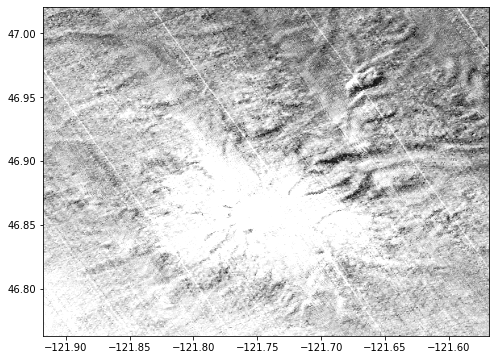

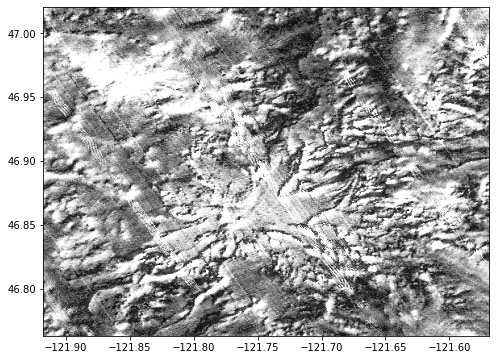

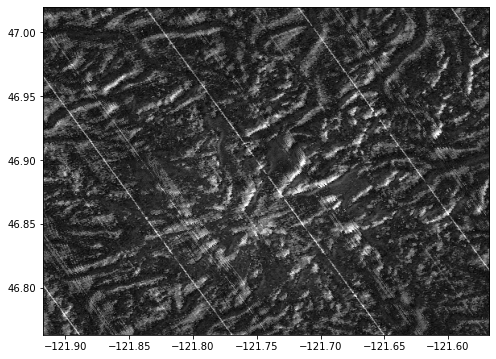

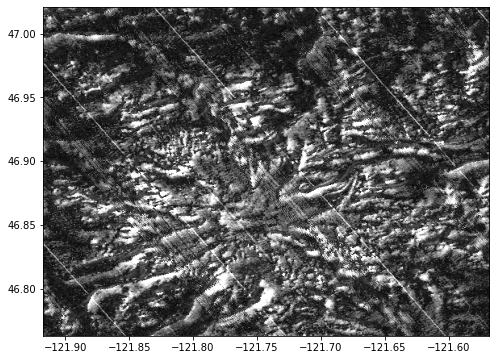

...

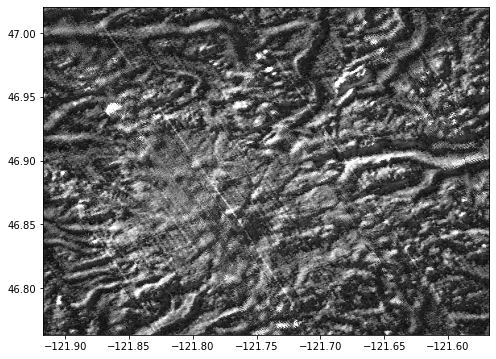

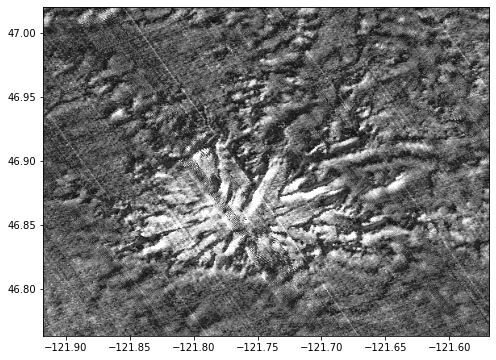

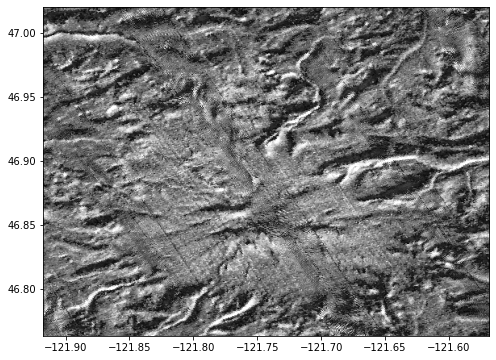

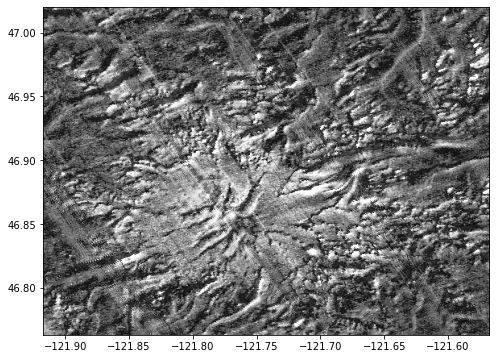

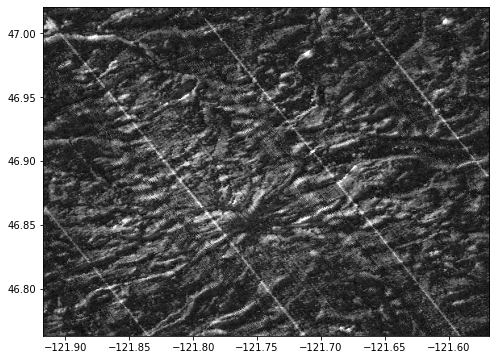

In [917]:
# Plot the good images
## Plot time series of ECOSTRESS image error 

imdir = '/Users/corey/Documents/GitHub/jpl_msp_2020/data/ecostress_mt_rainier'
plot_dir =imdir+'/plots'


imdir = '/Users/corey/Documents/GitHub/jpl_msp_2020/data/ecostress_mt_rainier'
labelled = pd.read_csv(os.path.join(imdir, 'labelled_images_rainier.csv'))
qced = labelled[labelled['qc_flag'] ==True]
doys = qced['images'].str.split('/').str[8].str.split('_').str[3].str.replace('doy', '')

plots = []


sheet = ips.sheet()

x, y = rainier_bounds.exterior.xy

for i , p in qced.iterrows():
    im = rio.open(p['images'])
    im_read = im.read(1)
    im_read = im_read.astype(float)
    im_read[im_read == 0] = np.nan
    scaled = (im_read*0.002)+0.49
    out = widget.Output()
    with out:
        fig, ax = plt.subplots(figsize=(8,8))
        plot.show(scaled, transform=im.transform, cmap='Greys', vmin=0.9, vmax=0.99, ax=ax)
        #ax.set_xlim(x[0], x[2])
        #ax.set_ylim(y[0], y[2])
        t = int(p['images'].split('_')[7][3:])
        dt = pd.to_datetime(t, format='%Y%j%H%M%S')
        plt.title(dt.to_string())
        plt.show(fig)
        plots.append(out)

sheet = ips.sheet(columns=2, rows =len(plots))    
column1 = ips.column(0, plots)
column2 = ips.column(1, [False]*len(plots))
sheet





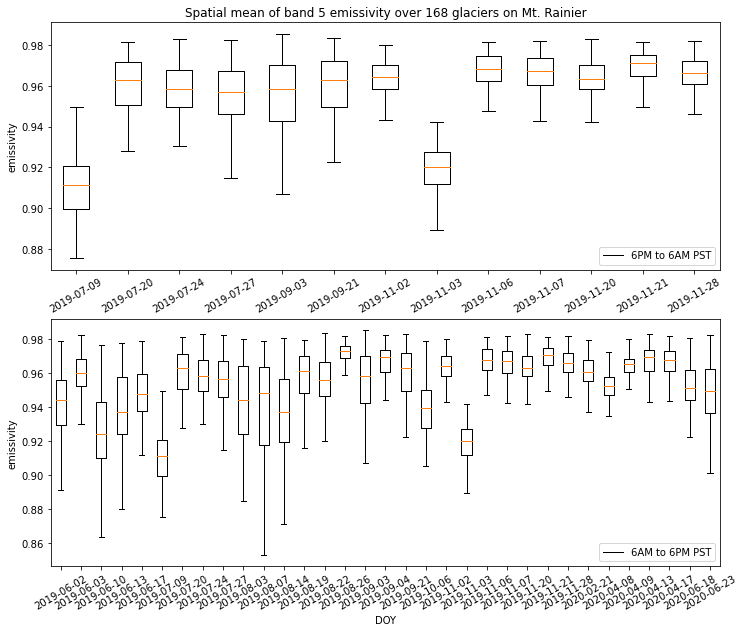

In [575]:
import seaborn as sns

fig, ax = plt.subplots(2, 1, figsize=(12, 10))

scaled = means*0.002 +0.49
scaled=scaled.T

night = scaled[(scaled.index.hour < 6) | (scaled.index.hour >= 18)].sort_index(axis=0)
day = scaled[(scaled.index.hour > 6) | (scaled.index.hour < 18)].sort_index(axis=0)

ax[0].boxplot(night, sym='')

ax[0].set_xticklabels(night.index.date, rotation=30)

ax[1].boxplot(day, sym='')

ax[1].set_xticklabels(day.index.date,  rotation=30)

ax[0].set_title('Spatial mean of band 5 emissivity over 168 glaciers on Mt. Rainier')
ax[1].set_xlabel('DOY')
ax[0].set_ylabel('emissivity')
ax[1].set_ylabel('emissivity')

ax[0].legend(['6PM to 6AM PST'], loc='lower right')
ax[1].legend(['6AM to 6PM PST'], loc='lower right')

plt.savefig('/Users/corey/Documents/GitHub/jpl_msp_2020/figures/mt_rainier_bowplot.png', dpi=300)


In [1]:
## Plot time series of ECOSTRESS image error 

imdir = '/Users/corey/Documents/GitHub/jpl_msp_2020/data/ecostress_mt_rainier'
plot_dir = imdir+'/plots'


imdir = '/Users/corey/Documents/GitHub/jpl_msp_2020/data/ecostress_mt_rainier'
labelled = pd.read_csv(os.path.join(imdir, 'labelled_images_rainier.csv'))
qced = labelled[labelled['qc_flag'] ==True]
doys = qced['images'].str.split('/').str[8].str.split('_').str[3].str.replace('doy', '')

plots = []
fnames = []

sheet = ips.sheet()

x, y = rainier_bounds.exterior.xy

for d, s, f, in os.walk(imdir):
    for row, i in enumerate(f):
        if 'ECO2LSTE.001_SDS_LST_err_' in i:
            doy = i.split('_')[4].replace('doy', '')
            if doys.str.contains(doy).any():
                fname = 'ECO2LSTE.001_SDS_LST_err_doy'+doy+'_aid0001.tif'
                p = os.path.join(imdir, fname)
                im = rio.open(p)
                im_read = im.read(1)
                im_read = im_read.astype(float)
                im_read[im_read == 0] = np.nan
                
                scaled = im_read*0.04
                out = widget.Output()
                with out:
                    fig, ax = plt.subplots()
                    plot.show(scaled, transform=im.transform, cmap='Greys',vmin=0, vmax=1.5, ax=ax)
                    #ax.set_xlim(x[0], x[2])
                    #ax.set_ylim(y[0], y[2])
                    plt.show(fig)
                    plots.append(out)
                    fnames.append(p)



NameError: name 'pd' is not defined

In [13]:
doys.str.contains(doy).any()

False

In [929]:
sheet = ips.sheet(columns=2, rows =len(plots))    
column1 = ips.column(0, plots)
column2 = ips.column(1, [False]*len(plots))
sheet

ValueError: 0 rows not supported

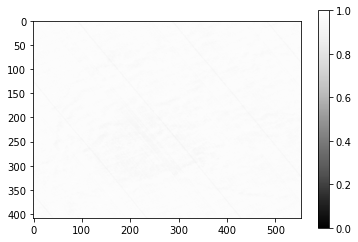

In [927]:


plt.imshow(scaled, vmin=0, vmax=1, cmap='Greys_r')
plt.colorbar()